__Probabilistic Programming. Wąsowski. Pardo. IT University of Copenhagen__

Some figures from 
* McElreath. _Statistical Rethinking. A Bayesian course with examples in R and STAN._ 2nd Ed.
* Kruschke. _Doing Bayesian Data Analysis. A tutorial with R, JAGS, and STAN._ 2nd Ed.

Adaptations of R examples to PymC3 courtesy of https://github.com/pymc-devs/resources/tree/master/Rethinking_2

# Week 1. Intro to Bayesian Inference (McElreath Ch.2+3)

In [ ]:
import matplotlib
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pymc as pm
import scipy.stats as stats
import xarray as xr

# the following sets up more compact UI (no semantic impact on the library otherwise)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
az.style.use("arviz-darkgrid")
xr.set_options(display_expand_data = False, display_expand_attrs = False);

RANDOM_SEED = 42
rng = np.random.default_rng(RANDOM_SEED)
np.random.seed(RANDOM_SEED) # used in our custom implementation of Metropolis

<br/><br/><br/><br/>

# Big Questions in PRPRO

This course is about answering questions **mathematically**, **programmatically**, and **data-driven**

- _Are sales results better between two website designs (A/B testing)?_
- _Can we predict whether a piece of text is a calendar date, in any language?_
- _Is a given website a trustworthy news source?_
- _Are Linux maintainers more hostile to newcomers than Mozilla maintainers?_
- _Are GitHub discussions of bugs longer than discussions of new features?_
- _Should a line of code depend to a critical section (be locked)?_

<br/><br/><br/><br/>

# Outline

1. What is Bayesian Inference (intuitions)
2. Basic Definitions and Bayes theorem
3. Analytical Inferrence
4. Grid Approximation
5. (Quadratic Approximation)
6. MCMC Approximation
7. Exploring the posterior (HDI, point estimates)
8. The Big Questions in PRPRO

<br/><br/><br/><br/>

# What is Bayesian Inference ?

<br/>

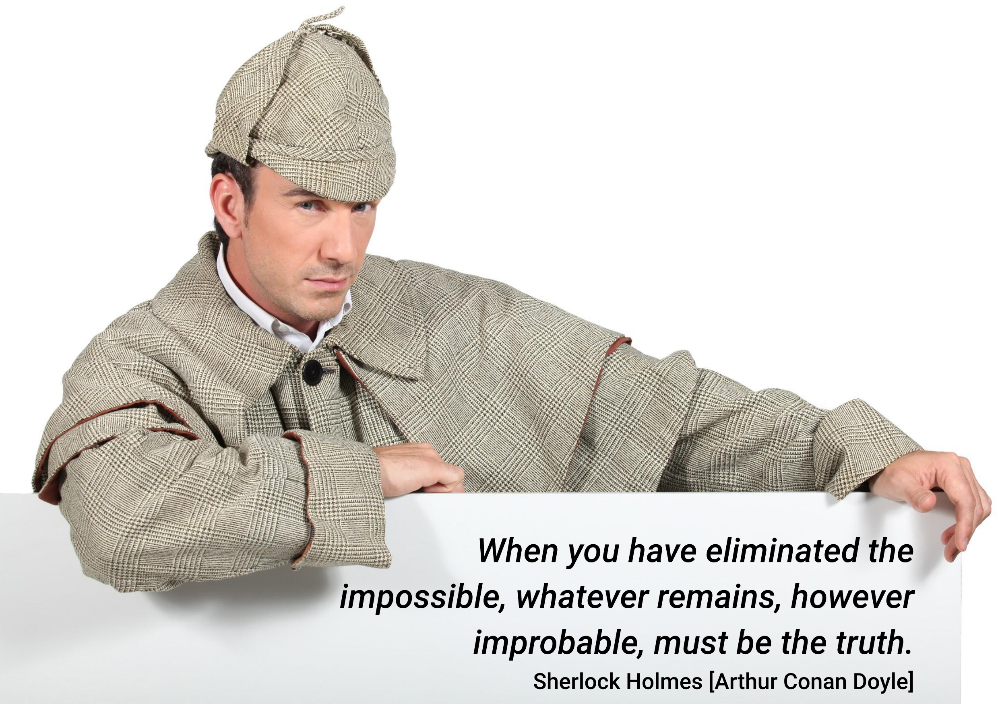

<br/><br/><br/><br/>

# The Sherlock Holmes Method
* Consider a set of possible causes for a crime a priori: A B C D
* Gather evidence that narrows down possible causes
* When down to one option, it must be the cause, however improbable initially
* Let A, B, C, D be four killer suspects (parameter values in a model). This process is visualized before using probability distributions over ABCD as our knowledge.

<br/><br/><br/><br/>

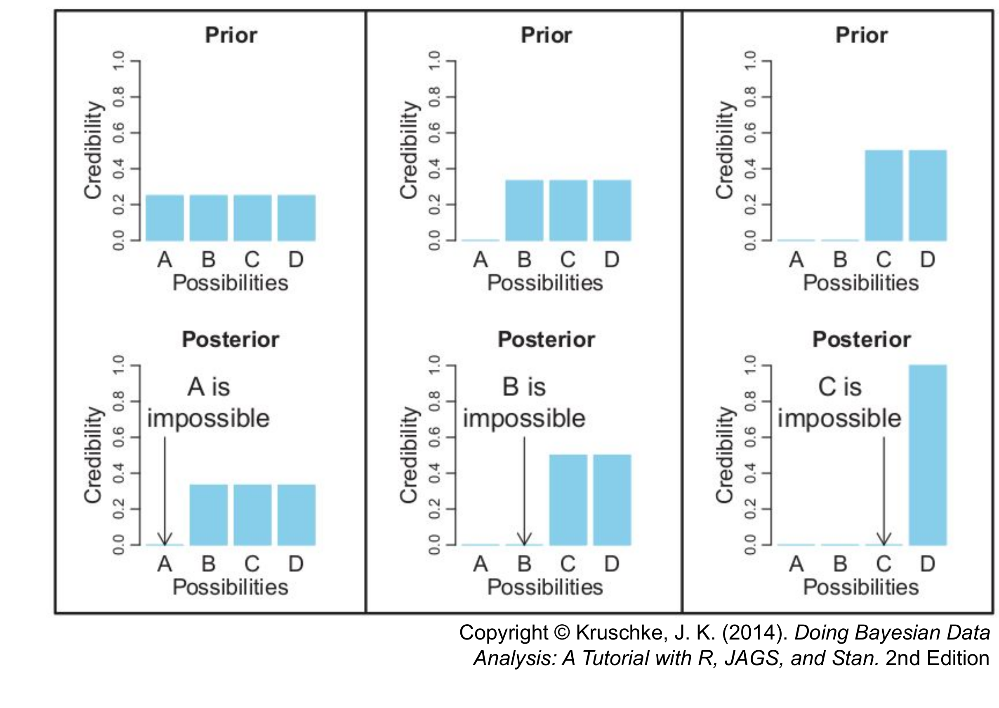

<br/><br/><br/><br/>

# Example: A Probabilistic Investigation (1)

* We have a bag with 4 marbles, some of them white (**W**), some of them blue (**B**), but we do not know how many of each 

* **Prior information (Conjectures):** 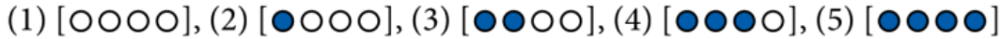

* **Observations (Data):** We have pulled three marbles out of a bag with replacement: **BWB**
* **Inference 1:** The first conjecture (**WWWW**) is implausible. We have seen some blues!
* **Inference 2:** The last conjecture (**BBBB**) is also implausible. We have seen a white!

* Can we make this inferences into a general principle?

<br/><br/><br/><br/>

# Example: A Probabilistic Investigation (2)

Let us try to understand what are all possible results of the experiments given the second conjecture (**BWWW** in the bag)

<div  style="text-align: center">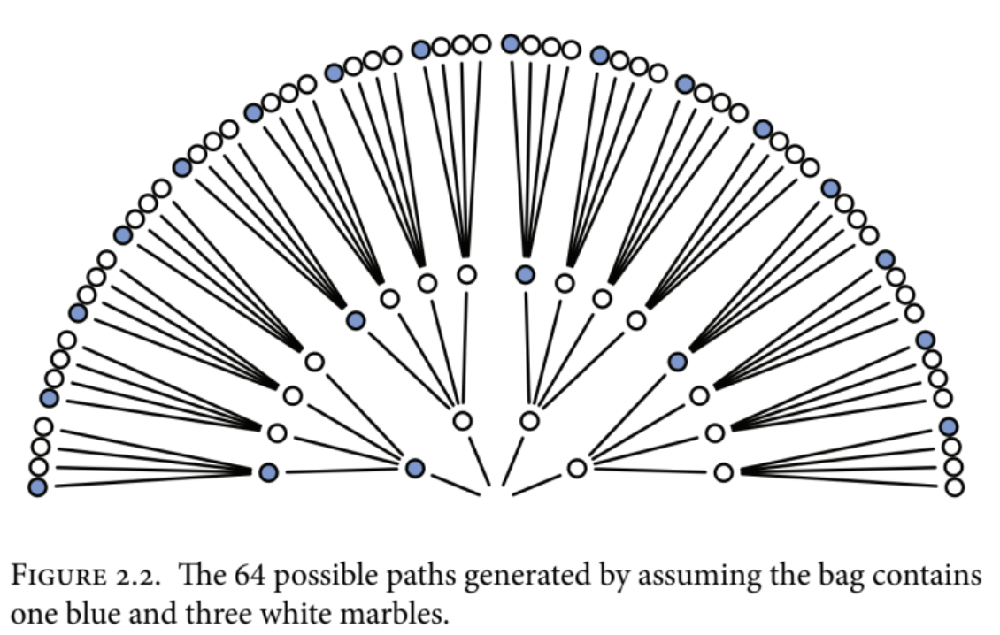</div>

<p style="text-align: right; font-style: italic; font-size:x-small">(from McErleath)</p>

<br/><br/><br/><br/>

# Example: A Probabilistic Investigation (3)

Now mark those that are consistent with our observation **BWB**

<div  style="text-align: center">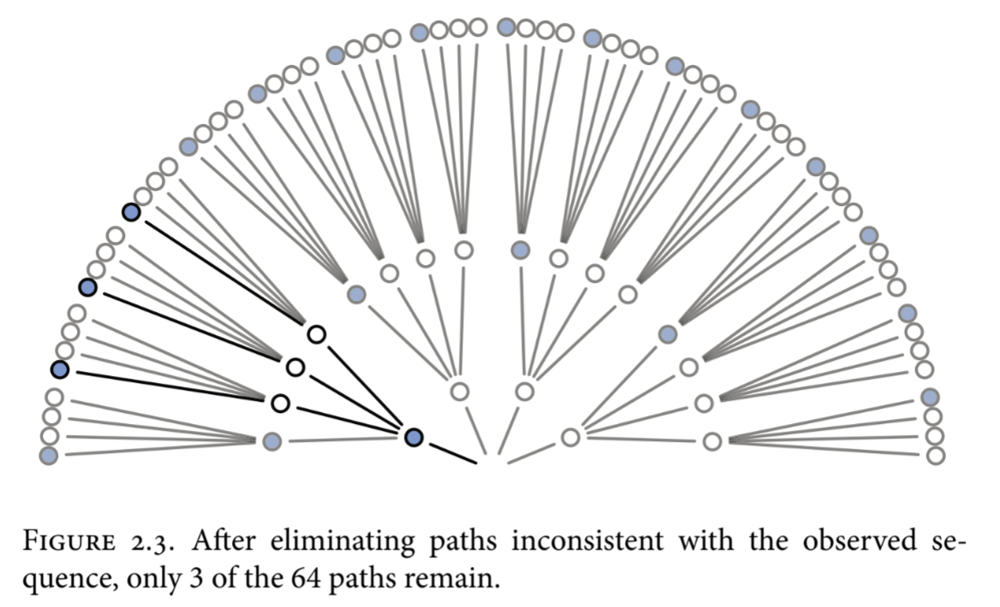</div>

<p style="text-align: right; font-style: italic; font-size:x-small">(from McErleath)</p>

<br/><br/><br/><br/>

# Example: A Probabilistic Investigation (4)

Now do this for the other three plausible conjectures (left: **BWWW**, right: **BBBW**, bottom-center: **BBWW**) 

<div  style="text-align: center">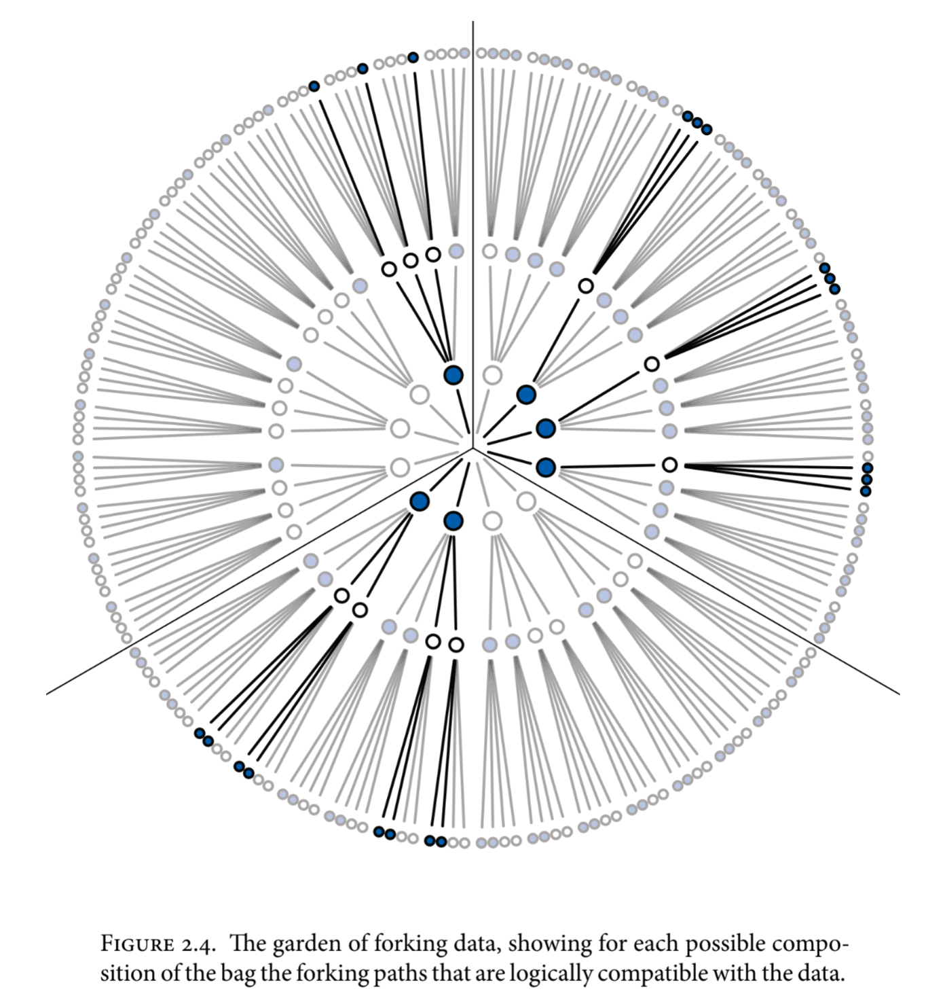</div>
<p style="text-align: right; font-style: italic; font-size:x-small">(from McErleath)</p>

* **BBBW** is most likely - it explains the data in more ways; it agrees more with data.
* The counts are called __likelihoods__
* We just did the _maximum likelihood estimation_ (MLE); it assumes that all conjectures are equally likely
* If we have prior belives that one of the hypotheses is more likely, we **weigh by prior** probabilities (done using Bayes theorem).

<br/><br/><br/><br/>

# A Hypothesis about a Continuous Value?

* **What is the proportion of water (W) and land (L) on the surface of Earth?**
* We will estimate this using randomization
* (if you think long enough, you will see this is a similar question to _how biased is a coin?_)
* Let $p\in[0;1]$ be probability a random point on Earth is covered by water
* No prior preconception for $p$.
* Then the initial probability distribution over $p$ is uniform
* (a constant density function with $\Pr(p)=1$ for all values of $p$, dashed in the top-left diagram below; It represents that we believe in each of the values of $p$ equally _a priori_)
* Now we are going to collect some data by picking random points and checking whether they are covered by water.
* The diagrams below show subsequent beliefs about the value of $p$ after new experiments coming in.

<br/><br/><br/><br/>

<div style="text-align: center;">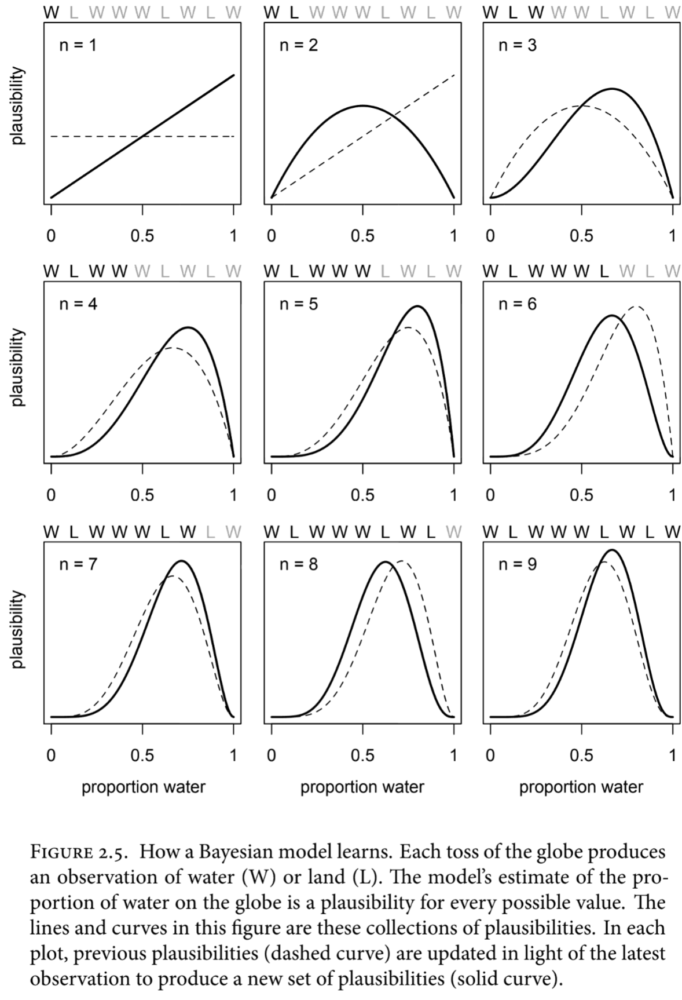</div>
<p style="text-align: right; font-style: italic; font-size:x-small">(from McErleath)</p>

* __Question:__ why probability values are higher than 1 in these graphs?

<br/><br/><br/><br/>

# Possibilities are parameter values
* When building a Bayesian model, fix what we know in the **structure**
* Leave what we do not know to model **parameters**
* In the example above we fixed the range of values for $p$ (between 0 and 1), but we left $p$ free

<br/><br/><br/><br/>

# Basics of Probability Theory

We do not do basic probability theory in this course.  This is a collection of basic definitions (and dramatically, even incorrectly!, simplified) that we will need to distinguish in the course.

__Definition 1.__ A __probability measure__ $\mu$ on a (possibly infinite) set $S$ assigns to each event $E \subseteq S$ a non-negative real number $\mu(E) \in [0, 1]$ such that

1. $\mu(\emptyset)= 0$,
1. $\mu(S) = 1$, and
2. $\mu(\bigcup_{i \in I} A_i) = \sum_{i \in I} \mu(A_i)$ for any
countable disjoint family of sets $(A_i)_{i\in I} \subseteq S$.

<br/>

__Definition 2.__ If the set $S$ is finite or countable then we call $\mu$ a **probability mass function**, and often denote it $p$, $q$, $P$, or $\Pr$. (We need various notations because often we need to consider multiple probability distributions at the same time.)

<br/>

__Definition 3.__ If the set $S$ (with measure $\mu$) is continuous, typically just $\mathbb{R}^n$ for some $n$, then we define a **cumulative distribution function** $F: \mathbb{R}^n \rightarrow [0;1]$ to be:
$$
  F(\overline x) = \mu( \bigwedge_{i\in 1..n} x_i \leq \overline x_i )
$$
A CDF uniquely characterizes a distribution. CDFs are monotonic functions.  Here are some examples for $n=1$ (univariate).

In [ ]:
lambdas = [0.5, 1.0, 2.0]
grid = np.linspace(0, 5, 500)
for l in lambdas:
    values = stats.expon.cdf(grid, scale=1/l)
    plt.plot(grid, values, label=f'Lambda={l}')

plt.title('Cumulative Distribution Function (CDF) of Exponential Distribution', fontsize='medium')
plt.xlabel('x', fontsize='medium')
plt.ylabel('CDF(x)', fontsize='medium')
plt.tick_params(axis='both', labelsize='small')
plt.legend(fontsize='small')
plt.show()

__Definition 4.__ For a CDF $F$ we define a **probability density function (pdf)**, say $f$ to be its derivative (its gradient).  Where the cumullative probability (CDF) grows faster, then it must be more concentrated (in the PDF). 
$$
f(x) = F(x)dx
$$
We can get a probability of an event $A\subseteq S$ by integrating the density $f$ over $A$. This corresponds to calculating the field under the density curve.  So the line represents probability density, and the probability mass is represented by the field under the curve.
<br/>

In [ ]:
l = 0.5
grid = np.linspace(0, 5, 500)
values = stats.expon.pdf(grid, scale=1/l)
plt.plot(grid, values, label=f'Exponential (lambda={l})', color='black')
plt.fill_between(grid, values, where=[(i >= 1 and i <= 2) for i in grid], 
                 alpha=0.2, color='black', 
                 label='probability of x in [1;2]')
plt.title('Probability Density Function (PDF) of Exponential Distribution', fontsize="medium")
plt.xlabel('x', fontsize='medium')
plt.ylabel('pdf(x)', fontsize='medium')
plt.tick_params(axis='both', labelsize='small')
plt.legend(fontsize='small')
plt.show()

__Definition 5__. 
For our purposes, a random variable $X$ is a (measurable) function $X : S \rightarrow \mathbb R$.

The probabality that a random variable $X$ takes a value in a set $E \subseteq \mathbb{R}$ is 
$$\Pr(X\in E) = \mu(\{s \in S \mid X(s) \in E\})\enspace.$$

(so predicates / conditions on random variables define events in the sample space).
From now on we will avoid using $\mu$ for the probability measure, and use mostly $\Pr$.

<br/><br/>

__Definition 6__. Assume we have two events $A, B \subseteq S$. The probability that $A$ happens given that $B$ happens is defined as
$$
\Pr(A\mid B) = {\Pr (A \cap B) \over \Pr B} 
$$
This definition works both for continuous and discrete spaces.

<br/><br/>


__Chain Rule__. $\Pr (A \land B) = \Pr (A | B) \cdot \Pr (B)$

__Law of Total Probability__. $\Pr(A)=\sum_n \Pr(A\mid B_n)\Pr(B_n)$ where $\bigcup_n B_n = S$ and all disjoint

<br/><br/><br/><br/>

# Bayes Theorem

$$
\Pr(p\mid D) = {\Pr(D\mid p)\cdot\Pr(p)\over \Pr(D)}
$$

Right-hand side:
* $p$ - unknown parameter, what **we are learning/inferring**
* $D$ - observed data
* $\Pr(D\mid p)$ - __likelihood__ of observing the data for each given value of $p$
* $\Pr(p)$ - a distribution of __prior__ belief about values of $p$, **what we know before**
* $\Pr(D)$ - Prior probability of seeing the data
  
Left-hand side:
* $\Pr(p\mid D)$ - __posterior__ belief about the parameter, **what we want to know** 

<br/><br/><br/><br/>

$\Pr(D)$ - can be expressed entirely in terms of the prior and likelihood, and, in the context of this course, it can be ignored, because we are just interested in relative differences of posterior value, which are not changed by a constant factor. If $\hat p$ ranges over all possible values of $p$ then:

$$
\Pr(D) = \sum_\hat p \Pr(D\mid p = \hat p) \Pr(p = \hat p) 
$$

or in the continuous case (where $\Pr$ stands for the probability density functions):

$$
\Pr(D) = \int_\hat p \Pr(D\mid p = \hat p) \Pr(p = \hat p) \, d \hat p 
$$

<br/><br/><br/><br/>

# Analysis of the Water/Land Example

* Assume that we have seen $W$ count of water and $L$ count of land
* $p$ is the unknown proportion of water on Earth
* The counts of Water and Land are distributed **binomially** if the proportion is $p$:

$$
\Pr(W, L \mid p) = {(W+L)!\over W!L!}p^W(1-p)^L
$$

* This is for known $p$ and random W and L (**likelihood**).

* We can use `scipy.stats` to calculate the probability of observing **six** $W$’s in **nine** tosses if $p=0.5$ as follows:

In [ ]:
stats.binom.pmf(6, n = 9, p = 0.5)

<br/><br/><br/><br/>

* Binomial distribution is a _maximum entropy distribution_ describing probability of exactly $W$ successes within $n = W+L$ trials.  This means that it makes no additional assumptions, no additional beliefs about the experiment.
* Recall we assumed a uniform prior $\Pr(p) = 1$ for all $p\in[0;1]$.

* To use Bayes theorem on this example, we stil need to know the probability of the observation $(W,L)$ for the normalizing denominator:
$$
\Pr(W,L) = \int_0^1 \Pr(W,L \mid p)\Pr(p)dp
$$

* With all these we could now solve the problem on paper using Bayes theorem. But we want to compute the answer instead! Paper does not scale for a lot of data and variables.

<br/><br/><br/><br/>

# Grid Approximation for the Water/Land Example

* The simplest approximation conceptually is the __grid approximation__
* Define a grid of values of $p$, compute the likelihood and prior for these points, multiply.
* To normalize, divide by the sum of the numerator over all points.
* Here is the code:

In [ ]:
def posterior_grid_approx(grid_points=5, success=6, tosses=9):
    # define grid
    p_grid = np.linspace(0, 1, grid_points)

    # define prior 
    prior = np.repeat(1, grid_points)  # uniform (the 1 is arbitrary, any positive constant would do)
    # prior = (p_grid >= 0.5).astype(int)  # truncated
    # prior = np.exp(- 5 * abs(p_grid - 0.5))  # double exp

    # compute likelihood at each point in the grid
    likelihood = stats.binom.pmf(success, tosses, p_grid)

    # compute product of likelihood and prior (pointwise multiplication, vectorization of *)
    unstd_posterior = likelihood * prior

    # standardize the posterior, so it sums to 1 (vectorization of division by a scalar)
    posterior = unstd_posterior / unstd_posterior.sum()
    return xr.DataArray(posterior, dims="p", coords={"p": p_grid})

<br/><br/><br/><br/>

We will now make two plots using the matplotlib convention. In this lingo this means we will create 1 row of plots, with 2 columns using `plt.subplots`. The last argument controls the size of the plots. You can play with it to see how it changes the size.  The function returns `ax` which as array (in this case 1D) containing the "placeholder" objects for each individual plots. We pass it below to xarray plotting function `plot` to populate with plots.

In [ ]:
W, N = 6, 9
points = (5, 50)

_, ax = plt.subplots(1, 2, figsize=(10, 4))
kwargs = { 'marker': 'o', 'color': 'black', 'markersize': 5, 'label': f'{W} x water in {N} trials' }

for i in range(2):
    posterior_grid_approx(points[i], W, N).plot(ax = ax[i], **kwargs)
    ax[i].set_title(f"{points[i]} grid points", fontsize="medium")
    ax[i].legend(fontsize='small')
    ax[i].tick_params(axis='both', labelsize='small')

plt.suptitle("Grid Approximation for the Water/Land Posterior")
plt.show()

* Note that the approximation is decent already for 20 points
* We can use linear interpolation between the points
* We can try other priors by changing the respective line in the `posterior_grid_approx` function (for very steep functions it may help to increase the number of points)
* Note that the maximum posterior value of $p$ is somewhere around 0.7 as expected (__MAP__)

<br/><br/><br/><br/>

# Quadratic Approximation for The Water/Land Example [optional]

* Unfortunately grid approximation does not scale.
* Problems already for 10 parameters, and we often want hundreds (how many points is $10^{50}$)?
* Known as the _curse of dimensionality_
* __Quadratic Approximation__, also known as __Guassian Approximation__ is a more efficient alternative
* It assumes that the posterior density in the vicinity of the maximum is Gaussian
* A Gaussian distribution can be described using only two numbers: the mean (center) and its variance (spread)

<br/><br/><br/><br/>

* PyMC implements Quadratic Approximation
* We build the model in PyMC (compare with the mathematical formulation of the model above)
* Incidentally, this is also our first model in the style dominant in the course.

In [ ]:
with pm.Model() as normal_approximation:
    # uniform prior
    p = pm.Uniform("p", 0, 1)  
    # binomial likelihood
    w = pm.Binomial("w", n=N, p=p, observed=W) 
    
    # First, find the posterior mode (the center)
    mean_q = pm.find_MAP()
    # compute the standard deviation(s)
    # Uses a Hessian based method, details of which are inessential for us now
    # Hessian is a square matrix of second-order partial derivatives of a scalar-valued function
    # The hessian for a function of single real variable will only have one value 
    # (the second derivative of the posterior)
    std_q = ((- 1 / pm.find_hessian(mean_q, vars=[p], negate_output=False)) ** 0.5)[0]

# display summary of quadratic approximation
print("  Mean, Standard deviation\np {:.2}, {:.2}".format(mean_q["p"], std_q[0]))

* This gives as an idea of the most likely $p$ and whether $p$ has high variance (how confident we are) 
* Quadratic approximation scales better for complex models
* The details of the math are less important now, as we want to understand how models are build primarily.
* But note the low precision, and high uncertainty. We won't be using it much in the course (unlike the book)

<br/><br/><br/><br/>

# Markov Chain Monte Carlo (MCMC) Approximation of the Posterior for Water/Land
* Quadratic approximation will sometimes fail; For complex models we cannot even formulate a single function to find the MAP and Hessian for. Also, it does assume that the posterior is normal around the mean, which may not be true.
* MCMC methods circumvent it, by replacing numerical analysis with sampling. Instead of optimizing and finding the solutions, we just sample from the posterior.
* This is somewhat similar to grid-approximation that "samples" from a fixed collection of points.  MCMC methods try to sample more from the areas where it matters more (not uniformly, like grid approximation does).
* There are sophisticated methods for this, for now just an example.
* PyMC is a state-of-the art library of these, so normally we do not implement them manually, like the example does.
* For now we do not have to understand this algorithm

In [ ]:
n_samples = 20000
p = np.zeros(n_samples)
p[0] = 0.5
L = N-W
for i in range(1, n_samples):
    p_new = stats.norm(p[i - 1], 0.1).rvs(1)[0]
    if p_new < 0:
        p_new = -p_new
    if p_new > 1:
        p_new = 2 - p_new
    q0 = stats.binom.pmf(W, n=W + L, p=p[i - 1])
    q1 = stats.binom.pmf(W, n=W + L, p=p_new)
    if stats.uniform.rvs(0, 1) < q1 / q0:
        p[i] = p_new
    else:
        p[i] = p[i - 1]
posterior = xr.DataArray(p, dims="sample#")

<br/><br/><br/><br/>

And a plot

In [ ]:
_, ax = plt.subplots(1, 2, figsize=(9, 3))
kwargs = { 'linestyle': 'None', 'markersize': 3, "marker": "o", "color": "black", "alpha": 0.1 }
posterior.plot(ax = ax[0], **kwargs)
ax[0].set_xlabel("sample number")
ax[0].set_ylabel("proportion water (p)")


x = np.linspace(0, 1, 100)
ax[1].plot(x, stats.beta.pdf(x, W + 1, L + 1), "black", label="True posterior")
az.plot_kde(p, ax = ax[1], label="Metropolis approximation", plot_kwargs = { "color": "C1" })
ax[1].legend(fontsize='small')
ax[1].set_xlabel("proportion water (p)")
ax[1].set_ylabel("density");
plt.show()

<br/><br/><br/><br/>

# Summarizing Probability

Samples from distributions (priors, posteriors, likelihood) can help to answer many questions:

* How much posterior probability lies __below__ some parameter value?
* Which parameter values marks __the lower 5%__ of the posterior probability (very unlikely)?
* Which range of parameter values __contains 90%__ of the posterior probability (very likely)?
* Which parameter value has __highest posterior probability__ (mode)?

You answer these questions for the posterior, because they let you understand what you have learned/inferred.

It makes sense to ask them for a prior as well, to debug your model, before you fit the data in.

We explore these questions in exercises, but zoom into some now.

<br/><br/><br/><br/>

# Highest Posterior Density Interval (HPDI, HDI)

* Interval that best represents the __parameter values most consistent with the data__, or 
* The __narrowest interval containing the given percentage of probability mass__.
* HDPI is __commonly used__ in Bayesian statistics. 
* It is __particularly useful if__ the distribution it summarizes is __asymetric__.
* Otherwise it is practically the same as a __percentile interval__
  - A _percentile interval_ (PI) assigns equal weight to both tails, as shown in the figure to the left
* The HDI always includes the __maximum probability value__, unlike PI 

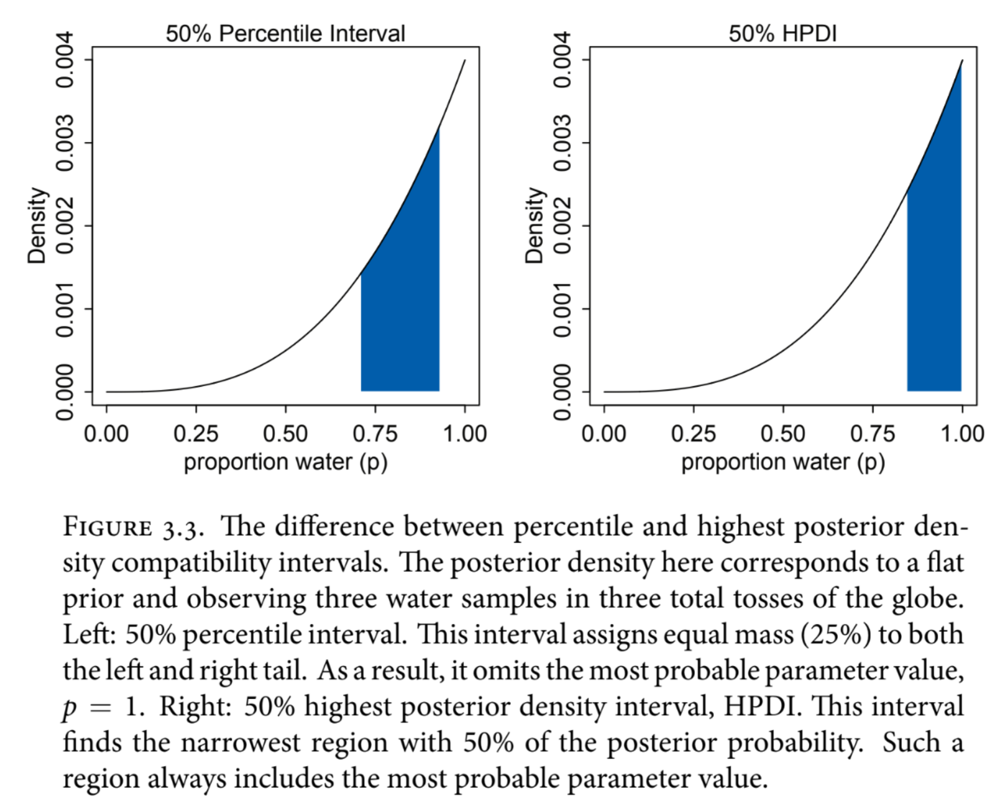


<br/><br/><br/><br/>

* Our libraries use the name __HDI__ (it makes sense for other distributions than a posterior, too)
* Here is a simple example how to __compute__ it 
  - (for the same distribution as the figure above, arviz provides the function using a sample set of a distribution as an input)


In [ ]:
az.hdi(posterior.data, hdi_prob=0.95)

* HDI also has some __disadvantages__ over percentile intervals (PI): 
  1. It is more expensive to compute 
  2. Its endpoints are not very precisely estimated (when using samples); More precisely they are more sensitve to the sample size (greater simulation variance). We can observe this, by changing the sample size in the code above.
* In any case, neither HDI nor PI as defined in Bayesian texts, has nothing to do with __confidence intervals__ of classical frequentist statistics, if you heard about those.
  - Confidence intervals are __not probability__ intervals.

<br/><br/><br/><br/>

# Point Estimates



* Let $\overline x$ be a random value sampled from our probability density function (PDF) $p$

* __mode__: is the __maximum__ probability density value (MAP, _maximum a posteriori_, this estimate maximizes belief):
  $$\text{mode}(p) = \arg \max_x p(x)$$

* __mean__: is the __expected__ (or average) value of the parameter in the posterior, minimizes the sum of squares distance of the parameter value (this estimate minimizes __variance__):
  $$\mu = \text{mean}(p) = \mathbb{E}(x) = \int x\cdot p(x)\, dx \quad \text{minimizes} \quad \mathbb{E}\left((\mu-\overline x)^2\right) \text{ which is variance}$$ 
* __median__: the middle point (minimizes the expected error of the parameter value)
  $$M = \text{median}(p) \quad \Pr(x \le  M) = \Pr(x \ge M) = \frac12 \quad \text{ minimizes} \quad \mathbb{E}\left(| M-\overline x |\right)$$

* Median is probably the easiest to use for the user.

<br/><br/><br/><br/>

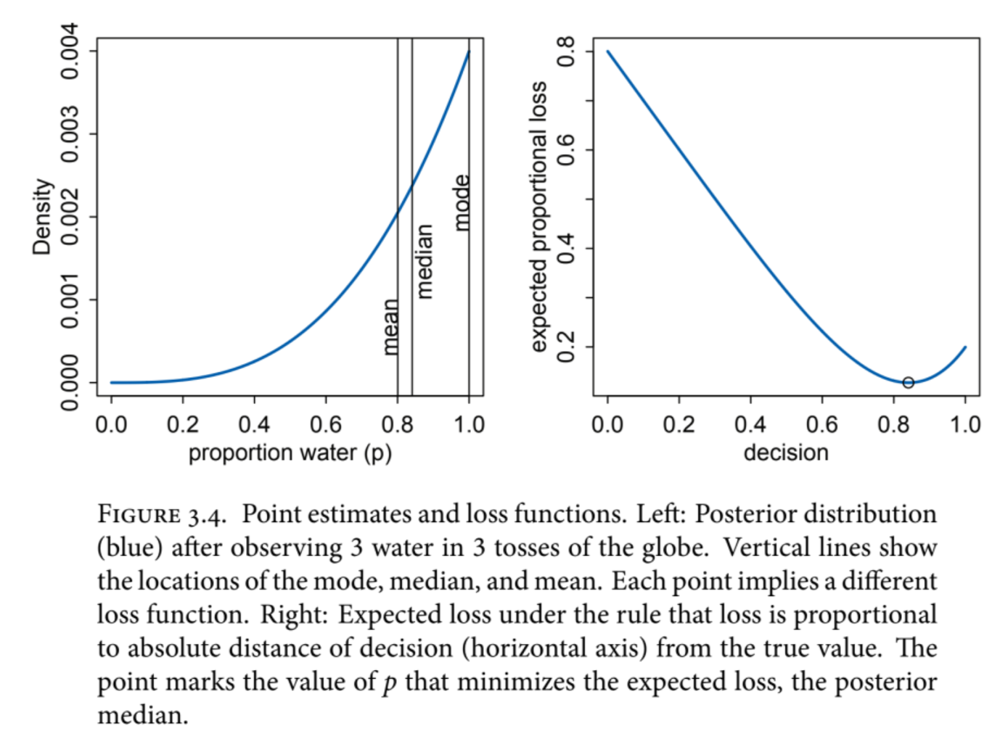

<br/><br/><br/><br/>

* Which one to use? Choose by the property they optimize and what is needed in the application.

* We **avoid using single point estimates** in Bayesian statistics, unlike in classical statistics.
* The **posterior distribution represents the entire information we have.**
* Single point representations __loose information__.
* See above in the figures that many values of the parameter are consistent with the data, with a similar density as the maximum density value.
* Sometimes we have to, when people really ask.

<br/><br/><br/><br/>

For the record, Python code for __computing mode, mean, and median__ from a sample (with values as in the figure shown above):

In [ ]:
np.mean(posterior.data), np.median(posterior.data)

In [ ]:
# Mode is more tricky for a continous variable as we first need approximate a continous function from a sample
pvals = np.linspace(0.0, 1.0, 10000)
pvals[np.argmax(stats.gaussian_kde(posterior.data).pdf(pvals))]

__Question__: How to compute the mode value from a grid approximation vector?

<br/><br/><br/><br/>

# Applications of sampling

1. __Model design__: sample from the prior, to understand your model, before you start analyzing data (and before you get biased by the data)
2. __Model checking__: sample from the posterior, to see whether the posterior predicts the input data reasonably (this is after you have seen the data)
3. __Software validation__: you can test software by simulating predictions for known parameter values (or priors) and checking whether the results are as expected.
4. __Research design__: pose a hypothesis what the observations will be, simulate them, and check whether these observations will give you a strong enough posterior to make your conclusions. (before collecting the data)
5. __Forecasting__: Make predictions of new observations. (this is the most ML-ish application)

Number 2 and 5 are related to the __posterior predictive__ distribution, which we discuss below in a bit more detail.


<br/><br/><br/><br/>

# Posterior Predictive (Distribution)

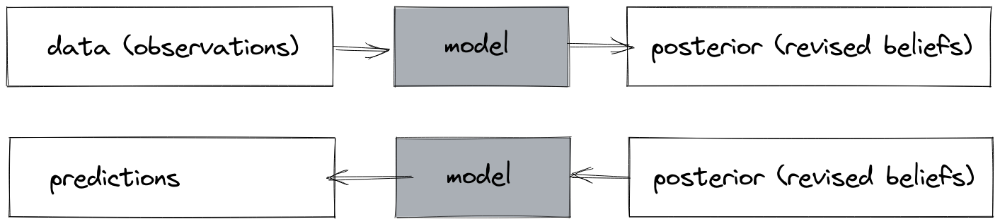

* To sample (make predictions) from the posterior, we first sample the parameter values from the posterior, and then use the model to produce predictions. 
* __Definition__: The _posterior-predictive distribution_ is the distribution induced on the data (observations) by the posterior on the parameters.
* For example, if we have a binomial likelihood and a uniform prior:
  $$p \sim \mathrm{Uniform}(0,1)$$
  $$W \sim \mathrm{Binomial}(N,p)$$
  And we make some observation on the number of successes $W$, obtaining a new posterior distribution on $p$, the posterior-predictive distribution is the distribution on the data (amount of Water), given the new posterior on $p$:
* Below producing 9 predictions from the posterior:
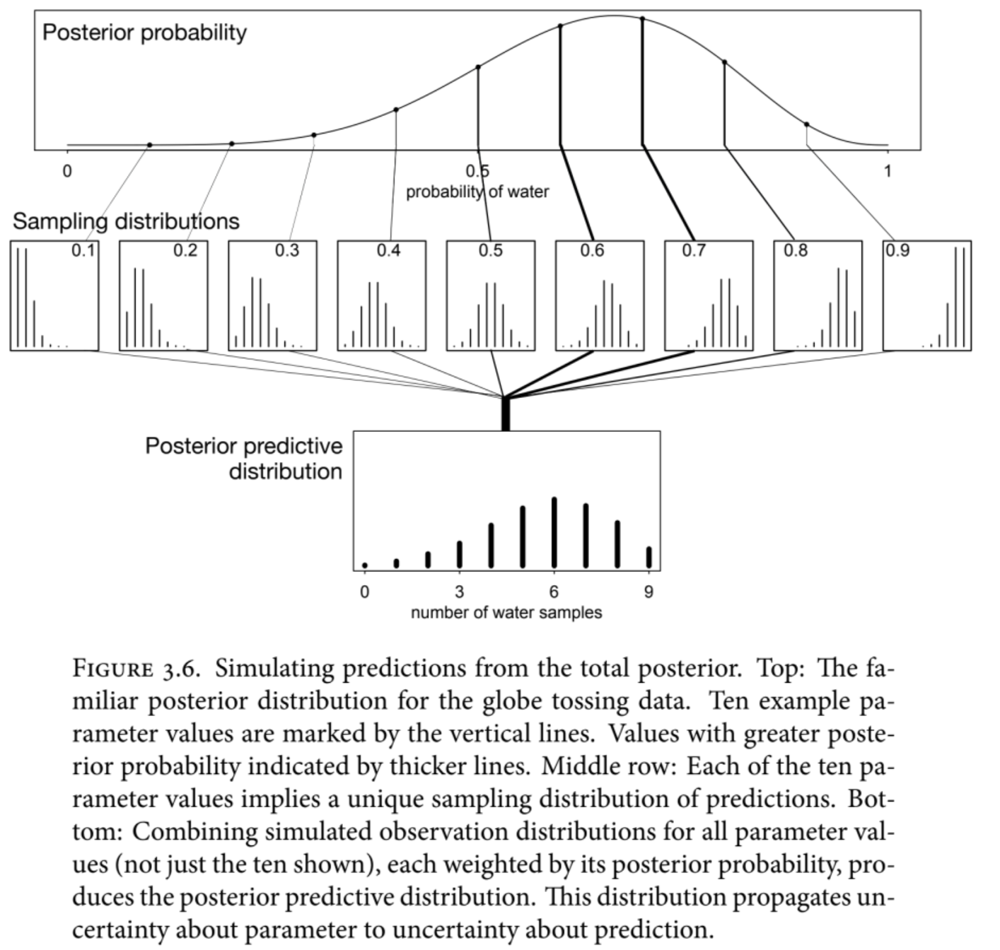
* Observe how convincingly correct it is, how the __entire posterior probability mass participates in the prediction__, not a single zero-mass point estimate
* The single point estimates seem to overfit more. __Why?__
* We shall see the posterior predictive in action for a more complex problem in the later lectures.
